#Sanket S Houde (18387)

# Uploading files

In [2]:
from google.colab import files
files.upload()

Saving testing_dataset.csv to testing_dataset.csv
Saving testing_features.csv to testing_features.csv


{'testing_dataset.csv': b'text,author,id\n"He kept looking round at the tramp and trying to understand how a live, sober man could fail to remember his name.",AC,dummy\n"""You are an orthodox Christian, aren\'t you?""",AC,dummy\n"""Yes,"" the tramp answered mildly.",AC,dummy\n"""Why, to be sure!",AC,dummy\n"I go to church and to the sacrament, and do not eat meat when it is forbidden.",AC,dummy\n"And I observe my religious duties punctually....""  ""Well, what are you called, then?""",AC,dummy\n"""Call me what you like, good man.""",AC,dummy\n"The other constable, Nikandr Sapozhnikov, maintained a staid silence.",AC,dummy\n"He was not so naive as Ptaha, and apparently knew very well the reasons which might induce an orthodox Christian to conceal his name from other people.",AC,dummy\n"He walked apart and did not condescend to idle chatter with his companions, but, as it were, tried to show everyone, even the fog, his sedateness and discretion.",AC,dummy\n"""God knows what to make of yo

In [3]:
from google.colab import files
files.upload()

Saving training_dataset.csv to training_dataset.csv
Saving training_features.csv to training_features.csv


{'training_dataset.csv': b'text,author,id\n"""You are mad, and gone the wrong way.",AC,dummy\n"You would marvel if suddenly apple and orange trees should bear frogs and lizards instead of fruit, and if roses should begin to breathe the odour of a sweating horse.",AC,dummy\n"So do I marvel at you, who have bartered heaven for earth.",AC,dummy\n"""That I may show you in deed my contempt for that by which you live, I waive the two millions of which I once dreamed as of paradise, and which I now despise.",AC,dummy\n"That I may deprive myself of my right to them, I shall come out from here five minutes before the stipulated term, and thus shall violate the agreement.""",AC,dummy\n"When he had read, the banker put the sheet on the table, kissed the head of the strange man, and began to weep.",AC,dummy\n"Never at any other time, not even after his terrible losses on the Exchange, had he felt such contempt for himself as now.",AC,dummy\n"Coming home, he lay down on his bed, but agitation and t

# Converting to databases

In [4]:
!pip3 install nltk
!pip3 install seaborn
!pip3 install langdetect
!pip3 install wordcloud
!pip3 install vaderSentiment

     |████████████████████████████████| 983kB 6.9MB/s 
  Created wheel for langdetect: filename=langdetect-1.0.8-cp36-none-any.whl size=993193 sha256=d6dd6d82f1fb8333ac55018cf71f9f1494e5cb84f972779e974bd0f62e99ba41
  Stored in directory: /root/.cache/pip/wheels/8d/b3/aa/6d99de9f3841d7d3d40a60ea06e6d669e8e5012e6c8b947a57
Successfully built langdetect
     |████████████████████████████████| 133kB 6.3MB/s 


In [5]:
import nltk
# nltk.download()

import numpy as np
import pandas as pd
import requests
import seaborn as sns
#import matplotlib.pyplot as plt
#from wordcloud import wordcloud, STOPWORDS
import os
import itertools

from nltk import sent_tokenize, word_tokenize, FreqDist
from nltk.data import load
from wordcloud import WordCloud, STOPWORDS
from langdetect import detect

from math import ceil

from pandas import read_csv

from datetime import datetime

from collections import Counter

from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer

from sklearn import metrics, model_selection, svm
from sklearn.model_selection import train_test_split
from sklearn.feature_extraction.text import CountVectorizer, TfidfTransformer, TfidfVectorizer
from sklearn.feature_selection import SelectKBest, chi2, RFE, SelectFromModel
from sklearn.decomposition import PCA
from sklearn.svm import LinearSVC
from sklearn.pipeline import Pipeline
from sklearn.linear_model import SGDClassifier, LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.naive_bayes import GaussianNB, BernoulliNB, MultinomialNB
from sklearn.svm import SVC
from sklearn.ensemble import (RandomTreesEmbedding, RandomForestClassifier,
                              GradientBoostingClassifier, AdaBoostClassifier, ExtraTreesClassifier, VotingClassifier)
from sklearn.metrics import log_loss, fbeta_score, make_scorer, confusion_matrix, roc_curve
from sklearn.calibration import CalibratedClassifierCV

from os import path
from PIL import Image
from multiprocessing.dummy import Pool

from sklearn import datasets  # toy datasets

start_time = datetime.now()


import matplotlib.pyplot as plt
%matplotlib inline

In [6]:
import pandas as pd
tr1=pd.read_csv("training_dataset.csv")
ts1=pd.read_csv("testing_dataset.csv")
df_feat_tr1=pd.read_csv("training_features.csv")
df_feat_ts1=pd.read_csv("testing_features.csv")

# Construction of the X_train and X_test with all the features

In [7]:
print ('Shape of df_feat_tr1 Matrix: ', df_feat_tr1.shape)
print ('Amount of Non-Zero occurences: ', np.count_nonzero(df_feat_tr1.values))
print ('sparsity: %.2f%%' % (100.0 * np.count_nonzero(df_feat_tr1.values) /
                                 (df_feat_tr1.shape[0] * df_feat_tr1.shape[1])))
print('')

print ('Shape of df_feat_ts1 Matrix: ', df_feat_ts1.shape)
print ('Amount of Non-Zero occurences: ', np.count_nonzero(df_feat_ts1.values))
print ('sparsity: %.2f%%' % (100.0 * np.count_nonzero(df_feat_ts1.values) /
                                 (df_feat_ts1.shape[0] * df_feat_ts1.shape[1])))

Shape of df_feat_tr1 Matrix:  (1663, 1829)
Amount of Non-Zero occurences:  249768
sparsity: 8.21%

Shape of df_feat_ts1 Matrix:  (231, 1829)
Amount of Non-Zero occurences:  31739
sparsity: 7.51%


<h1>Prediction: Selection of best set of feature selection technique and prediction model </h1>

<h2>Quantitative parameters transformation</h2>
Quantitative parameters were transferred into a numerical vector with min-max normalization
from 0 to 1. <br>
<br>
It is necessary to have normalized vectors before training our dataset to avoid a disequilibrium among the coefficients.<br>
This is particularly true because we will use technics such as PCA which requires the use of normalization because it needs the same range of variation in order to compare variances of the features.  



In [8]:
def build_normalization(df):
    result = df.copy()
    for feature_name in list(df):
        max_value = df[feature_name].max()
        min_value = df[feature_name].min()
        if max_value != min_value:
            result[feature_name] = (df[feature_name] - min_value) / (max_value - min_value)
    return result
build_normalization(df_feat_ts1).head()



,count_emph,count_dial,count_dial_break,break_to_dial_ratio,count_fem,count_mas,fem_to_mas_ratio,length_character,length_sentence,length_word,vocabulary_sentence,density_stopword,density_noun,density_verb,density_adjective,adjective_to_noun,density_coma,density_point,density_colon,density_semicolon,density_interro,density_expl,density_positive,density_negative,density_neutral,density_compound,positive,anger,disgust,fear,negative,sadness,anticipation,joy,surprise,trust,af,ca,cy,da,...,"aid, """,foste,"stman,","well,",aid fo,driver,d fost,"tman,",there!,postma,","" sai",g on h,of cou,she wo,purpos,shall,"e, dr.",drawi,said,d rais,nimmo.,araman.1,i shal,raissa.1,course.1,he sai,weathe,aid ni,atriz,"y, the",raiss,battle,", you",the k,preci,e said,ostman,his wi,you ar,postm
0,0.0,0.0,0.0,0.0,0.0,0.428571,0.0,0.173333,0.20,0.948980,0.913168,0.634615,0.229167,0.687500,0.333333,0.312500,0.056152,0.087719,0.0,0.0,0.000000,0.000000,0.000000,0.184041,0.815959,0.134688,0.000000,0.0,0.227273,0.227273,0.181818,0.181818,0.000000,0.000000,0.0,0.000000,0,0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0
1,0.0,0.5,0.0,0.0,0.0,0.000000,0.0,0.056667,0.05,0.336735,0.461196,0.564103,0.114583,0.458333,0.333333,0.357143,0.200535,0.000000,0.0,0.0,0.409091,0.000000,0.000000,0.000000,1.000000,0.453088,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0,0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.907371,0.0
2,0.0,0.5,0.0,0.0,0.0,0.000000,0.0,0.038333,0.03,0.285714,0.418151,0.188034,0.152778,0.305556,0.000000,0.000000,0.278914,0.303030,0.0,0.0,0.000000,0.000000,0.538051,0.000000,0.481338,0.689056,0.000000,0.0,1.000000,1.000000,0.800000,0.800000,0.000000,0.000000,0.0,0.000000,0,0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0
3,0.0,0.5,0.0,0.0,0.0,0.000000,0.0,0.011667,0.02,0.314869,0.442748,0.483516,0.000000,0.392857,0.571429,0.714286,0.573987,0.000000,0.0,0.0,0.000000,0.705882,0.619493,0.000000,0.402831,0.676315,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0,0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0
4,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.113333,0.15,0.908700,0.780635,0.890688,0.217105,0.578947,0.210526,0.200000,0.098039,0.128205,0.0,0.0,0.000000,0.000000,0.000000,0.191763,0.808237,0.205613,0.470588,0.0,0.000000,0.000000,0.000000,0.000000,0.294118,0.294118,0.0,0.294118,0,0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0


So now, we have the normalized features matrix. 

<h2>Load and prepare data</h2>

This below loads the data and put the matrices in shape for the predictive part.

In [9]:
# load dataset
author_list=['AC','IA','LB']
names = author_list
dataframe_train = build_normalization(df_feat_tr1)
dataframe_train.to_csv('dataframe_train')

X_train = dataframe_train.values
#X_trainx=X_train.dropna(axis=1)
Y_train = tr1.author

names = author_list
dataframe_test = build_normalization(df_feat_ts1)
dataframe_test.to_csv('dataframe_test')
 
X_test = dataframe_test.values
Y_test = ts1.author

In [10]:

print(X_train)
print(np.shape(Y_test))
print(X_test)

[[0.  0.4 0.  ... 0.  1.  0. ]
 [0.  0.2 0.  ... 0.  0.  0. ]
 [0.  0.2 0.  ... 0.  0.  0. ]
 ...
 [0.  0.2 0.  ... 0.  0.  0. ]
 [0.  0.2 0.  ... 0.  0.  0. ]
 [0.  0.4 0.5 ... 0.  0.  0. ]]
(231,)
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.5        0.         ... 0.         0.90737069 0.        ]
 [0.         0.5        0.         ... 0.         0.         0.        ]
 ...
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]]


<h2>Feature selection</h2>


### Univariate feature selection 

In [11]:
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import f_classif
from numpy import set_printoptions

In [12]:
# feature extraction
test = SelectKBest(score_func=f_classif, k=500)
fit = test.fit(X_train, Y_train)
# summarize scores
set_printoptions(precision=3)
print(fit.scores_)
X_train_uf = fit.transform(X_train)
X_test_uf = fit.transform(X_test)
print(X_train_uf.shape)
print(X_test_uf.shape)

[ 9.834 25.268 80.524 ... 29.94   6.551 17.983]
(1663, 500)
(231, 500)


/usr/local/lib/python3.6/dist-packages/sklearn/feature_selection/_univariate_selection.py:114: UserWarning: Features [37 43 45 46 50 52 53 54 56 59 66 67 68 79 86 89 96 97] are constant.
  UserWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/feature_selection/_univariate_selection.py:115: RuntimeWarning: invalid value encountered in true_divide
  f = msb / msw


### Principal Component Analysis

In [14]:
from sklearn.decomposition import PCA

In [15]:
pca = PCA(n_components=500)
fit = pca.fit(X_train)
X_train_pca = fit.transform(X_train)
X_test_pca = fit.transform(X_test)

In [16]:
print(X_train_pca.shape)

(1663, 500)


# Conventional Classification models

### Univariate feature selection

In [17]:
import logging
import numpy as np
from optparse import OptionParser
import sys
from time import time
import matplotlib.pyplot as plt


from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.feature_extraction.text import HashingVectorizer
from sklearn.feature_selection import SelectFromModel
from sklearn.feature_selection import SelectKBest, chi2
from sklearn.linear_model import RidgeClassifier
from sklearn.pipeline import Pipeline
from sklearn.svm import LinearSVC
from sklearn.linear_model import SGDClassifier
from sklearn.linear_model import Perceptron
from sklearn.linear_model import PassiveAggressiveClassifier
from sklearn.naive_bayes import BernoulliNB, ComplementNB, MultinomialNB,GaussianNB
from sklearn.neighbors import KNeighborsClassifier
from sklearn.neighbors import NearestCentroid
from sklearn.ensemble import RandomForestClassifier
from sklearn.utils.extmath import density
from sklearn import metrics
from sklearn.linear_model import LogisticRegression

In [ ]:
def benchmark(clf):
    print('_' * 80)
    print("Training: ")
    print(clf)
    t0 = time()
    clf.fit(X_train_uf, Y_train)
    train_time = time() - t0
    print("train time: %0.3fs" % train_time)

    t0 = time()
    pred = clf.predict(X_test_uf)
    test_time = time() - t0
    print("test time:  %0.3fs" % test_time)

    score = metrics.accuracy_score(Y_test, pred)
    print("accuracy:   %0.3f" % score)

    

    

    '''if opts.print_report:
        print("classification report:")
        print(metrics.classification_report(y_test, pred,
                                            target_names=target_names))'''

  # if opts.print_cm:
       ## print("confusion matrix:")
       # print(metrics.confusion_matrix(Y_test, pred))

    print()
    clf_descr = str(clf).split('(')[0]
    return clf_descr, score, train_time, test_time


results_uf = []
for clf, name in (
        (RidgeClassifier(tol=1e-2, solver="sag"), "Ridge Classifier"),
        (Perceptron(max_iter=50), "Perceptron"),
        (PassiveAggressiveClassifier(max_iter=50),
         "Passive-Aggressive"),
        (KNeighborsClassifier(n_neighbors=1), "kNN"),
        (RandomForestClassifier(), "Random forest"),
        (LogisticRegression(C=7),'Logistic Regression'),
        (GradientBoostingClassifier(learning_rate=0.1,n_estimators=500,random_state=0),'Gradient Boosting CLassifier'),
        (AdaBoostClassifier(n_estimators=1000,learning_rate=0.1, random_state=0),'ADA boost classifier')):
    print('=' * 80)
    print(name)
    results_uf.append(benchmark(clf))

for penalty in ["l2", "l1"]:
    print('=' * 80)
    print("%s penalty" % penalty.upper())
    # Train Liblinear model
    results_uf.append(benchmark(LinearSVC(penalty=penalty, dual=False,
                                       tol=1e-3)))

    # Train SGD model
    results_uf.append(benchmark(SGDClassifier(alpha=.01, max_iter=50,
                                           penalty=penalty)))

# Train SGD with elasticnet penalty
print('=' * 80)
print("Elastic-Net penalty")
results_uf.append(benchmark(SGDClassifier(alpha=.01, max_iter=50,penalty="elasticnet",random_state=1)))

# Train NearestCentroid without threshold
print('=' * 80)
print("NearestCentroid (aka Rocchio classifier)")
results_uf.append(benchmark(NearestCentroid()))

# Train sparse Naive Bayes classifiers
print('=' * 80)
print("Naive Bayes")
#results_uf.append(benchmark(MultinomialNB(alpha=.01)))
results_uf.append(benchmark(GaussianNB()))
#results_uf.append(benchmark(ComplementNB(alpha=.1)))


print('=' * 80)
print("LinearSVC with L1-based feature selection")
# The smaller C, the stronger the regularization.
# The more regularization, the more sparsity.
results_uf.append(benchmark(Pipeline([
  ('feature_selection', SelectFromModel(LinearSVC(penalty="l1", dual=False,
                                                  tol=1e-3))),
  ('classification', LinearSVC(penalty="l2"))])))




Ridge Classifier
________________________________________________________________________________
Training: 
RidgeClassifier(alpha=1.0, class_weight=None, copy_X=True, fit_intercept=True,
                max_iter=None, normalize=False, random_state=None, solver='sag',
                tol=0.01)
train time: 0.552s
test time:  0.002s
accuracy:   0.710

Perceptron
________________________________________________________________________________
Training: 
Perceptron(alpha=0.0001, class_weight=None, early_stopping=False, eta0=1.0,
           fit_intercept=True, max_iter=50, n_iter_no_change=5, n_jobs=None,
           penalty=None, random_state=0, shuffle=True, tol=0.001,
           validation_fraction=0.1, verbose=0, warm_start=False)
train time: 0.123s
test time:  0.001s
accuracy:   0.688

Passive-Aggressive
________________________________________________________________________________
Training: 
PassiveAggressiveClassifier(C=1.0, average=False, class_weight=None,
                        

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py:940: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)


train time: 0.406s
test time:  0.001s
accuracy:   0.706

Gradient Boosting CLassifier
________________________________________________________________________________
Training: 
GradientBoostingClassifier(ccp_alpha=0.0, criterion='friedman_mse', init=None,
                           learning_rate=0.1, loss='deviance', max_depth=3,
                           max_features=None, max_leaf_nodes=None,
                           min_impurity_decrease=0.0, min_impurity_split=None,
                           min_samples_leaf=1, min_samples_split=2,
                           min_weight_fraction_leaf=0.0, n_estimators=500,
                           n_iter_no_change=None, presort='deprecated',
                           random_state=0, subsample=1.0, tol=0.0001,
                           validation_fraction=0.1, verbose=0,
                           warm_start=False)
train time: 81.972s
test time:  0.007s
accuracy:   0.697

ADA boost classifier
_________________________________________________

/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py:947: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


train time: 2.401s
test time:  0.003s
accuracy:   0.714

________________________________________________________________________________
Training: 
SGDClassifier(alpha=0.01, average=False, class_weight=None,
              early_stopping=False, epsilon=0.1, eta0=0.0, fit_intercept=True,
              l1_ratio=0.15, learning_rate='optimal', loss='hinge', max_iter=50,
              n_iter_no_change=5, n_jobs=None, penalty='l1', power_t=0.5,
              random_state=None, shuffle=True, tol=0.001,
              validation_fraction=0.1, verbose=0, warm_start=False)
train time: 0.340s
test time:  0.002s
accuracy:   0.649

Elastic-Net penalty
________________________________________________________________________________
Training: 
SGDClassifier(alpha=0.01, average=False, class_weight=None,
              early_stopping=False, epsilon=0.1, eta0=0.0, fit_intercept=True,
              l1_ratio=0.15, learning_rate='optimal', loss='hinge', max_iter=50,
              n_iter_no_change=5, n_jobs=N

/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py:947: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


train time: 2.783s
test time:  0.002s
accuracy:   0.697



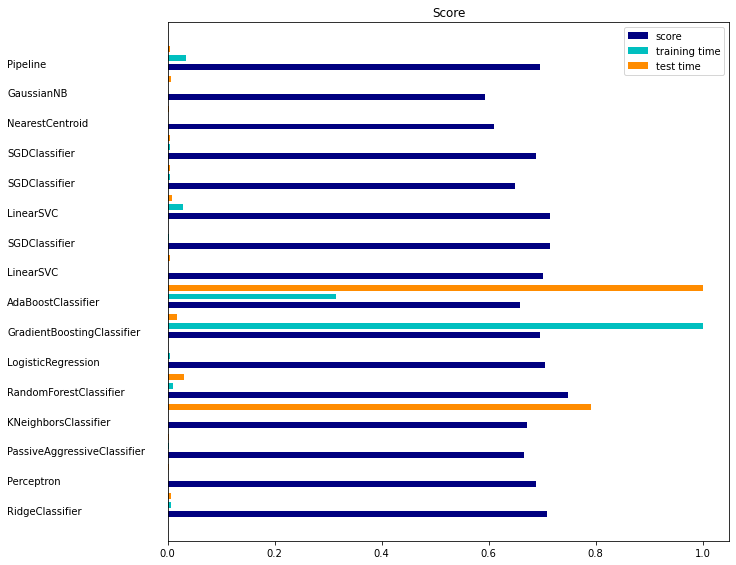

In [ ]:
results=results_uf.copy()
indices = np.arange(len(results))


results = [[x[i] for x in results] for i in range(4)]

clf_names, score, training_time, test_time = results
training_time = np.array(training_time) / np.max(training_time)
test_time = np.array(test_time) / np.max(test_time)

plt.figure(figsize=(12, 8))
plt.title("Score")
plt.barh(indices, score, .2, label="score", color='navy')
plt.barh(indices + .3, training_time, .2, label="training time",
         color='c')
plt.barh(indices + .6, test_time, .2, label="test time", color='darkorange')
plt.yticks(())
plt.legend(loc='best')
plt.subplots_adjust(left=.25)
plt.subplots_adjust(top=.95)
plt.subplots_adjust(bottom=.05)

for i, c in zip(indices, clf_names):
    plt.text(-.3, i, c)

plt.show()

## Principal component analysis

In [ ]:
def benchmark(clf):
    print('_' * 80)
    print("Training: ")
    print(clf)
    t0 = time()
    clf.fit(X_train_pca, Y_train)
    train_time = time() - t0
    print("train time: %0.3fs" % train_time)

    t0 = time()
    pred = clf.predict(X_test_pca)
    test_time = time() - t0
    print("test time:  %0.3fs" % test_time)

    score = metrics.accuracy_score(Y_test, pred)
    print("accuracy:   %0.3f" % score)

    

    

    '''if opts.print_report:
        print("classification report:")
        print(metrics.classification_report(y_test, pred,
                                            target_names=target_names))'''

  # if opts.print_cm:
       ## print("confusion matrix:")
       # print(metrics.confusion_matrix(Y_test, pred))

    print()
    clf_descr = str(clf).split('(')[0]
    return clf_descr, score, train_time, test_time


results_pca = []
for clf, name in (
        (RidgeClassifier(tol=1e-2, solver="sag"), "Ridge Classifier"),
        (Perceptron(max_iter=50), "Perceptron"),
        (PassiveAggressiveClassifier(max_iter=50),
         "Passive-Aggressive"),
        (KNeighborsClassifier(n_neighbors=1), "kNN"),
        (RandomForestClassifier(), "Random forest"),
        (LogisticRegression(C=7),"Logistic Regression"),
        
        (GradientBoostingClassifier(learning_rate=0.1,n_estimators=500,random_state=0),'Gradient Boosting CLassifier'),
        (AdaBoostClassifier(n_estimators=1000,learning_rate=0.1, random_state=0),'ADA boost classifier')):
    print('=' * 80)
    print(name)
    results_pca.append(benchmark(clf))

for penalty in ["l2", "l1"]:
    print('=' * 80)
    print("%s penalty" % penalty.upper())
    # Train Liblinear model
    results_pca.append(benchmark(LinearSVC(penalty=penalty, dual=False,
                                       tol=1e-3)))

    # Train SGD model
    results_pca.append(benchmark(SGDClassifier(alpha=.01, max_iter=50,
                                           penalty=penalty)))

# Train SGD with l2 penalty
print('=' * 80)
print("Elastic-Net penalty")
results_pca.append(benchmark(SGDClassifier(alpha=.01, max_iter=50,penalty="elasticnet",random_state=1)))

# Train NearestCentroid without threshold
print('=' * 80)
print("NearestCentroid (aka Rocchio classifier)")
results_pca.append(benchmark(NearestCentroid()))

# Train sparse Naive Bayes classifiers
print('=' * 80)
print("Naive Bayes")
#results.append(benchmark(MultinomialNB(alpha=.01)))
results_pca.append(benchmark(GaussianNB()))
#results.append(benchmark(ComplementNB(alpha=.1)))

print('=' * 80)
print("LinearSVC with L1-based feature selection")
# The smaller C, the stronger the regularization.
# The more regularization, the more sparsity.
results_pca.append(benchmark(Pipeline([
  ('feature_selection', SelectFromModel(LinearSVC(penalty="l1", dual=False,
                                                  tol=1e-3))),
  ('classification', LinearSVC(penalty="l2"))])))




Ridge Classifier
________________________________________________________________________________
Training: 
RidgeClassifier(alpha=1.0, class_weight=None, copy_X=True, fit_intercept=True,
                max_iter=None, normalize=False, random_state=None, solver='sag',
                tol=0.01)
train time: 0.436s
test time:  0.001s
accuracy:   0.727

Perceptron
________________________________________________________________________________
Training: 
Perceptron(alpha=0.0001, class_weight=None, early_stopping=False, eta0=1.0,
           fit_intercept=True, max_iter=50, n_iter_no_change=5, n_jobs=None,
           penalty=None, random_state=0, shuffle=True, tol=0.001,
           validation_fraction=0.1, verbose=0, warm_start=False)
train time: 0.191s
test time:  0.001s
accuracy:   0.723

Passive-Aggressive
________________________________________________________________________________
Training: 
PassiveAggressiveClassifier(C=1.0, average=False, class_weight=None,
                        

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_stochastic_gradient.py:557: ConvergenceWarning: Maximum number of iteration reached before convergence. Consider increasing max_iter to improve the fit.
  ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_stochastic_gradient.py:557: ConvergenceWarning: Maximum number of iteration reached before convergence. Consider increasing max_iter to improve the fit.
  ConvergenceWarning)


train time: 0.437s
test time:  0.001s
accuracy:   0.714

kNN
________________________________________________________________________________
Training: 
KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
                     metric_params=None, n_jobs=None, n_neighbors=1, p=2,
                     weights='uniform')
train time: 0.084s
test time:  0.363s
accuracy:   0.688

Random forest
________________________________________________________________________________
Training: 
RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=None, max_features='auto',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=100,
                       n_jobs=None, oob_score=False, random_state=None,
  

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py:940: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)


train time: 0.371s
test time:  0.001s
accuracy:   0.736

Gradient Boosting CLassifier
________________________________________________________________________________
Training: 
GradientBoostingClassifier(ccp_alpha=0.0, criterion='friedman_mse', init=None,
                           learning_rate=0.1, loss='deviance', max_depth=3,
                           max_features=None, max_leaf_nodes=None,
                           min_impurity_decrease=0.0, min_impurity_split=None,
                           min_samples_leaf=1, min_samples_split=2,
                           min_weight_fraction_leaf=0.0, n_estimators=500,
                           n_iter_no_change=None, presort='deprecated',
                           random_state=0, subsample=1.0, tol=0.0001,
                           validation_fraction=0.1, verbose=0,
                           warm_start=False)
train time: 381.684s
test time:  0.010s
accuracy:   0.719

ADA boost classifier
________________________________________________

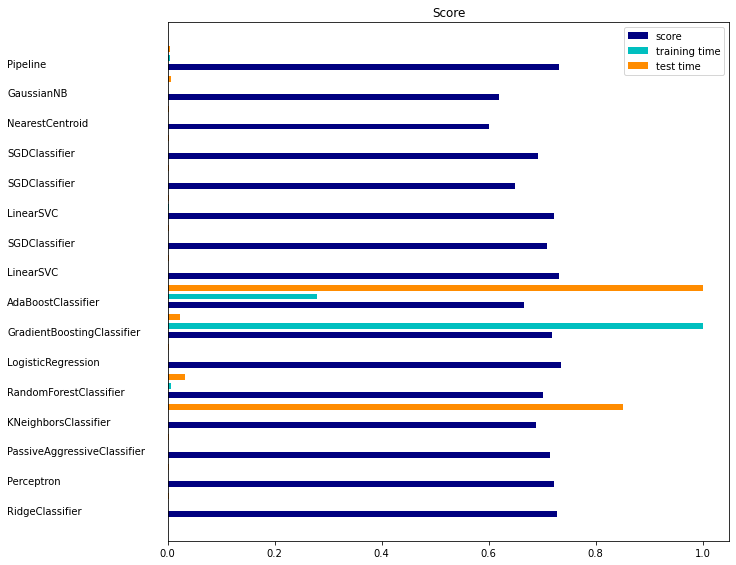

In [ ]:
results = results_pca.copy()
indices = np.arange(len(results))

results = [[x[i] for x in results] for i in range(4)]

clf_names, score, training_time, test_time = results
training_time = np.array(training_time) / np.max(training_time)
test_time = np.array(test_time) / np.max(test_time)

plt.figure(figsize=(12, 8))
plt.title("Score")
plt.barh(indices, score, .2, label="score", color='navy')
plt.barh(indices + .3, training_time, .2, label="training time",
         color='c')
plt.barh(indices + .6, test_time, .2, label="test time", color='darkorange')
plt.yticks(())
plt.legend(loc='best')
plt.subplots_adjust(left=.25)
plt.subplots_adjust(top=.95)
plt.subplots_adjust(bottom=.05)

for i, c in zip(indices, clf_names):
    plt.text(-.3, i, c)

plt.show()

## Random Forest Classifier metrics

***** Random Forest Classifier ( Univariate feature selection )******
Accuracy score :  0.7878787878787878
f1 score :  0.783908068820795


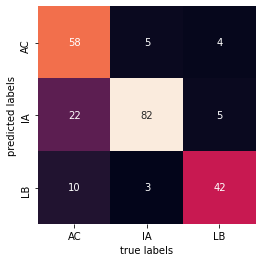

In [19]:

neigh = RandomForestClassifier()
neigh.fit(X_train_uf, Y_train)
labels = neigh.predict(X_test_uf)

from sklearn.metrics import confusion_matrix,accuracy_score,f1_score

print("***** Random Forest Classifier ( Univariate feature selection )******")
mat1=confusion_matrix(Y_test,labels)
sns.heatmap(mat1.T,square=True,annot=True,fmt='d',cbar=False,xticklabels=['AC','IA','LB'],yticklabels=['AC','IA','LB'])
#plotting heatmap of confusion matrix
plt.xlabel("true labels")
plt.ylabel("predicted labels")
print("Accuracy score : ",accuracy_score(Y_test,labels))
print("f1 score : ",f1_score(Y_test,labels,average='weighted'))

# Visualizing data

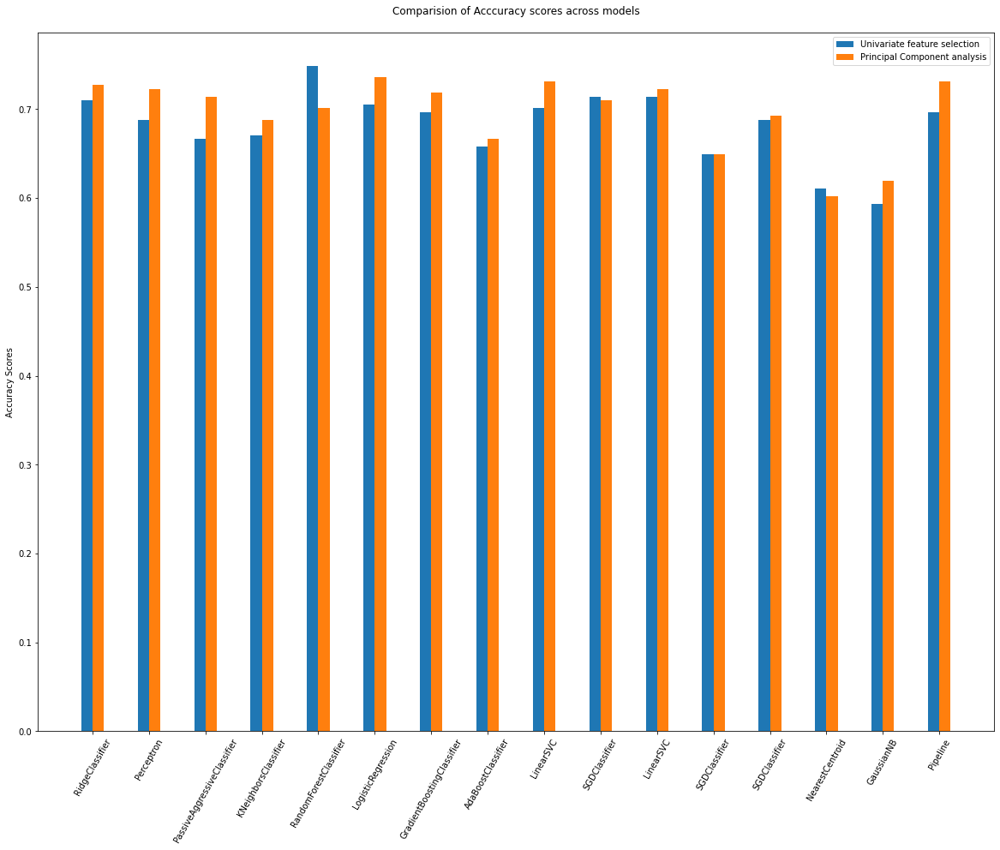

In [ ]:
import matplotlib
import matplotlib.pyplot as plt
import numpy as np


#labels = ['Naive Bayes(unigram)', 'Naive Bayes(bigram)','Naive bayes(trigram)','K-Nearest Neighbours', 'Random Forest', 'Support Vector Classifier']
labels_uf=np.asarray([x[0] for x in results_uf]).reshape((1,16))
labels=labels_uf[0].tolist()
results_eduf= np.asarray([x[1] for x in results_uf]).reshape((1,16))
results_edpca= np.asarray([x[1] for x in results_pca]).reshape((1,16))
uf_scores = results_eduf[0].tolist()
pca_scores = results_edpca[0].tolist()
#pos_tags = [97.9,96.2,99,97.9,97.1,100]

from pylab import rcParams
rcParams['figure.figsize'] = 20, 15

x = np.arange(len(labels))  # the label locations

width = 0.20  # the width of the bars

fig, ax = plt.subplots()
rects1 = ax.bar(x - width/2, uf_scores, width, label='Univariate feature selection')
rects2 = ax.bar(x + width/2 , pca_scores, width, label='Principal Component analysis')
#rects3 = ax.bar(x + width/2,pos_tags,width/2,label="With POS tags")

# Add some text for labels, title and custom x-axis tick labels, etc.
ax.set_ylabel('Accuracy Scores')
ax.set_title('Comparision of Acccuracy scores across models\n')
ax.set_xticks(x)
ax.set_xticklabels(labels,rotation=60)
ax.legend()
